In [1]:
import xarray as xr
import rasterio as rio
import rioxarray
import numpy as np
import matplotlib.pyplot as plt
from osgeo import gdal, gdal_array
from skimage import data, filters
from scipy.interpolate import interpn
import os

In [16]:
igram_date = '20200120_20200201'
work_dir = '/mnt/Backups/gbrench/repos/fusits/nbs/imja/agu_push/AT12'
#speckle_fn = f'{work_dir}/work/merged/interferograms/{igram_date}/veloc_unwrapped_aoi'
#unwrapped_est_fn = f'{work_dir}/work/merged/interferograms/{igram_date}/filt_fine_aoi_withest.unw'
unwrapped_noest_fn = f'{work_dir}/work/merged/interferograms/{igram_date}/filt_fine_aoi_noest.unw'
wrapped_fn = f'{work_dir}/work/merged/interferograms/{igram_date}/filt_fine_aoi.int'
cor_fn = f'{work_dir}/work/merged/interferograms/{igram_date}/filt_fine_aoi.cor'
components_fn = f'{work_dir}/work/merged/interferograms/{igram_date}/conn_comp'

In [17]:
wrapped_ds = gdal.Open(wrapped_fn, gdal.GA_ReadOnly)
wrapped = wrapped_ds.GetRasterBand(1).ReadAsArray()

cor_ds = gdal.Open(cor_fn, gdal.GA_ReadOnly)
cor = cor_ds.GetRasterBand(1).ReadAsArray()

# unwrapped_ds = gdal.Open(unwrapped_est_fn, gdal.GA_ReadOnly)
# unwrapped_est = unwrapped_ds.GetRasterBand(1).ReadAsArray()

unwrapped_ds = gdal.Open(unwrapped_noest_fn, gdal.GA_ReadOnly)
unwrapped_noest = unwrapped_ds.GetRasterBand(1).ReadAsArray()

# speckle_ds = gdal.Open(speckle_fn, gdal.GA_ReadOnly)
# speckle = speckle_ds.GetRasterBand(1).ReadAsArray()

components_ds = gdal.Open(components_fn, gdal.GA_ReadOnly)
components = components_ds.GetRasterBand(1).ReadAsArray()

In [125]:
# f, ax = plt.subplots(2, 2, figsize=(8, 8))
# ax[0, 0].imshow(np.flip(np.angle(wrapped), 0), cmap='twilight', interpolation='none')
# ax[0, 0].set_title('wrapped phase')
# ax[0, 1].imshow(np.flip(speckle, 0), cmap='RdBu_r', vmin=-50, vmax=50, interpolation='none')
# ax[0, 1].set_title('unwrapped phase estimate (speckle tracking)')
# ax[1, 0].imshow(np.flip(unwrapped_noest, 0), cmap='RdBu_r', vmin=-50, vmax=50, interpolation='none')
# ax[1, 0].set_title('InSAR unwrapped phase (corrected)')
# ax[1, 1].imshow(np.flip(cor, 0), cmap='Blues', vmin=0.5, vmax=0.50001, interpolation='none')
# ax[1, 1].set_title('InSAR unwrapped phase (no unwrapping correction)')
# f.tight_layout()

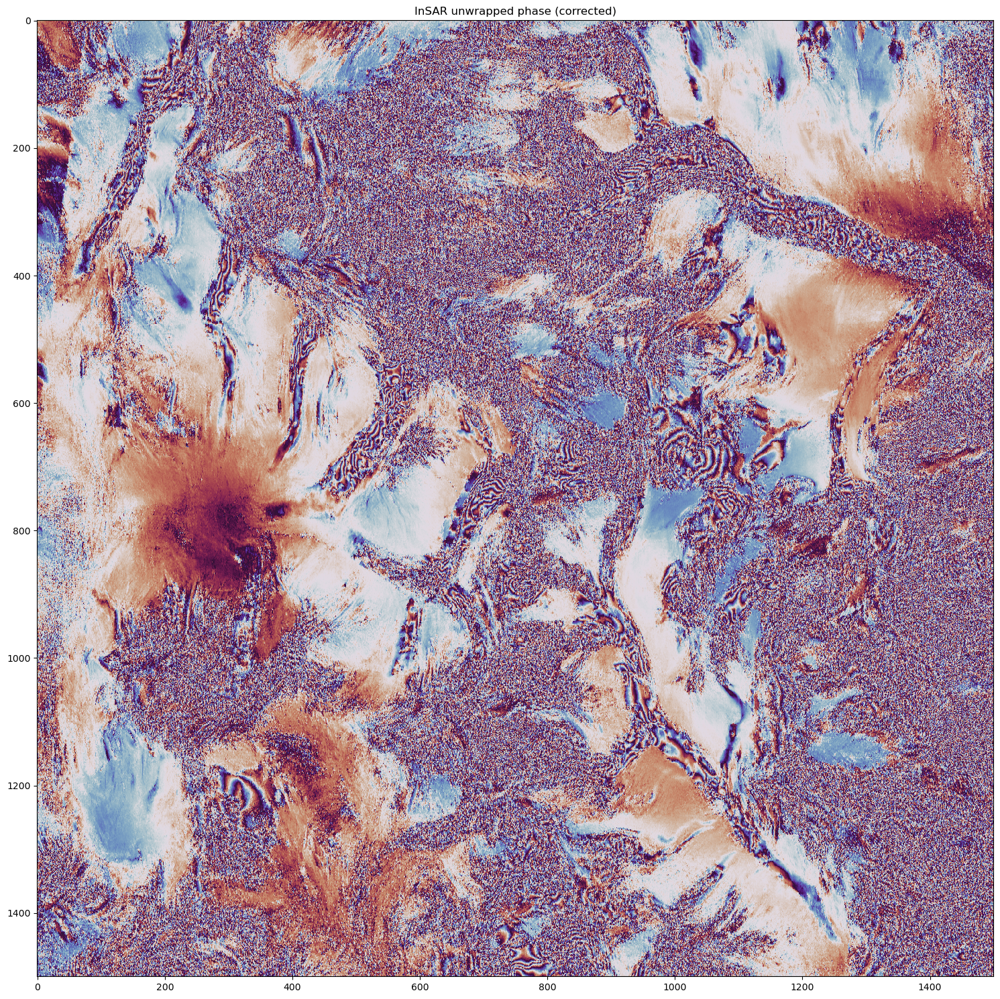

In [18]:
f, ax = plt.subplots(figsize=(15, 15))
ax.imshow(np.flip(np.angle(wrapped), 0), cmap='twilight', interpolation='none')
ax.set_title('InSAR unwrapped phase (corrected)')
f.tight_layout()

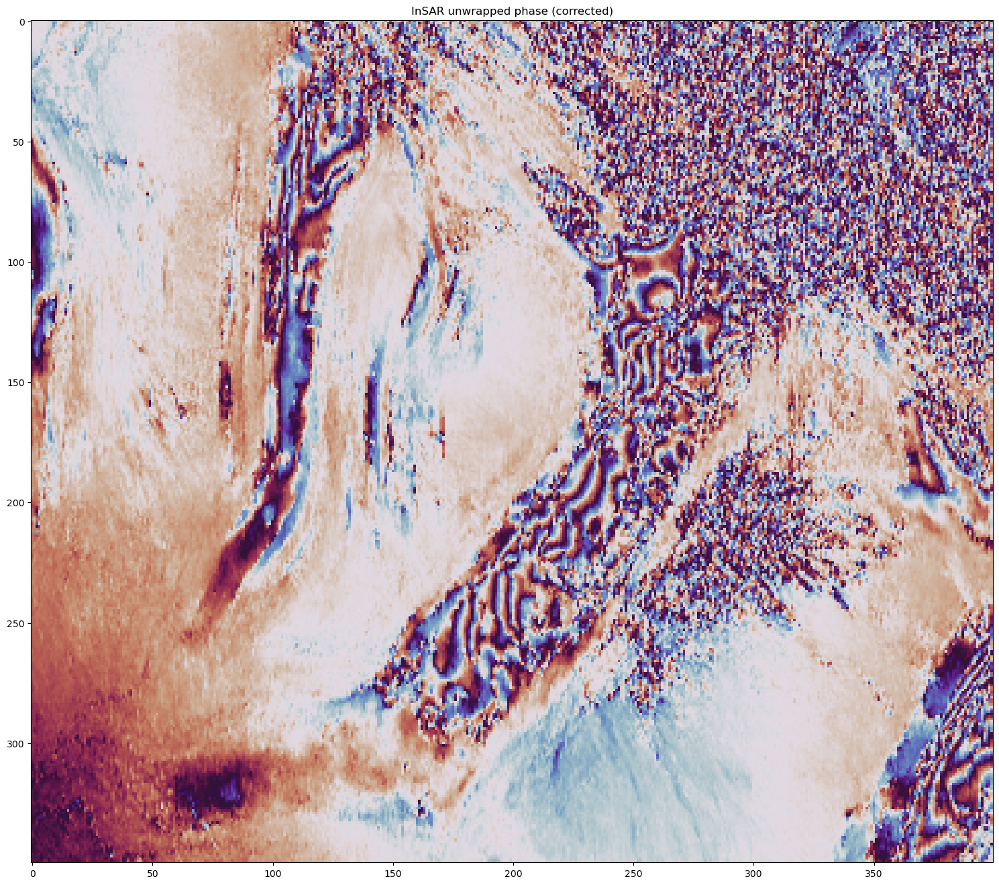

In [19]:
f, ax = plt.subplots(figsize=(15, 15))
ax.imshow(np.flip(np.angle(wrapped), 0)[450:800, 300:700], cmap='twilight', interpolation='none')
ax.set_title('InSAR unwrapped phase (corrected)')
f.tight_layout()
#f.savefig('

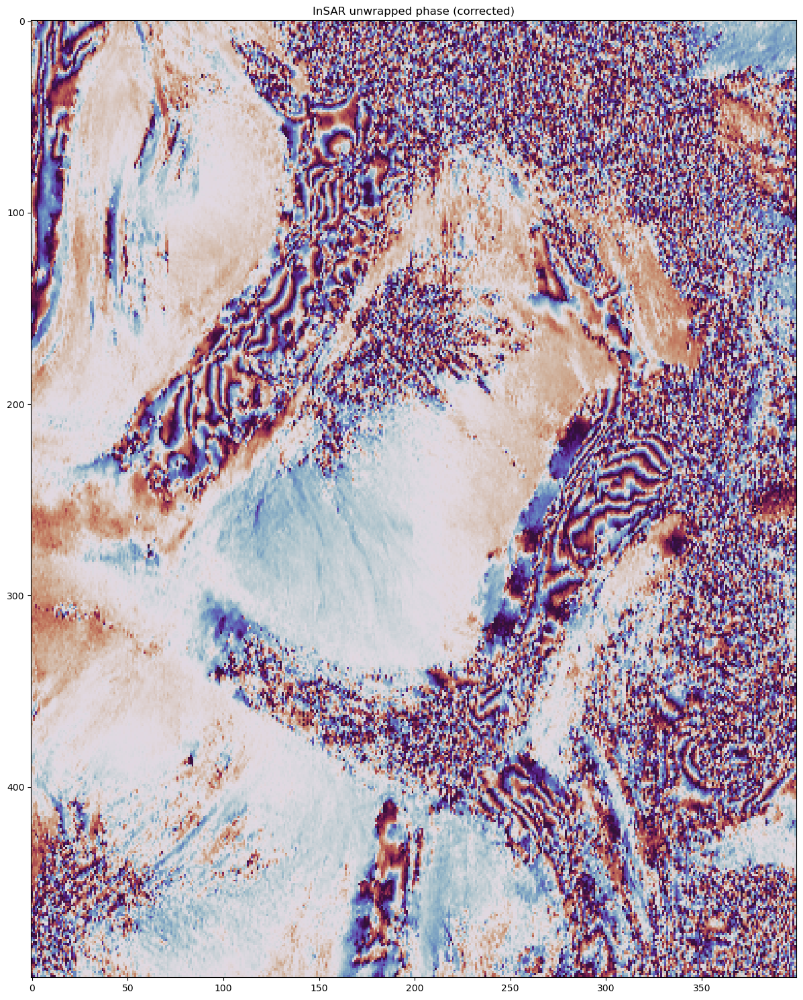

In [21]:
f, ax = plt.subplots(figsize=(15, 15))
ax.imshow(np.flip(np.angle(wrapped), 0)[500:1000, 400:800], cmap='twilight', interpolation='none')
ax.set_title('InSAR unwrapped phase (corrected)')
f.tight_layout()
f.savefig('wrapped_example.png', dpi=400)

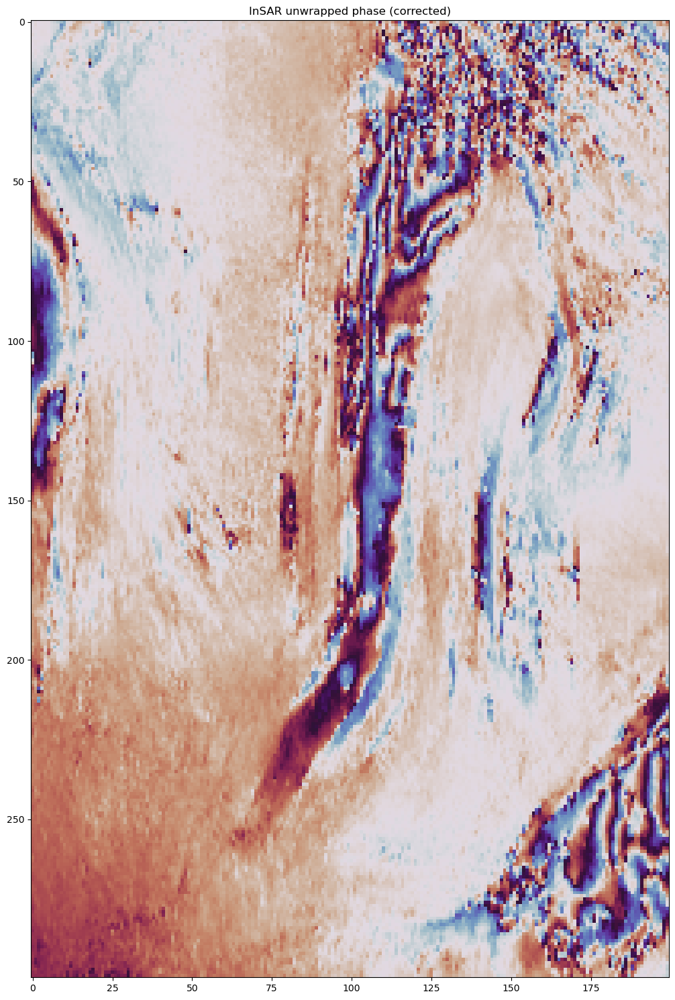

In [26]:
f, ax = plt.subplots(figsize=(15, 15))
ax.imshow(np.flip(np.angle(wrapped), 0)[450:750, 300:500], cmap='twilight', interpolation='none')
ax.set_title('InSAR unwrapped phase (corrected)')
f.tight_layout()
#f.savefig('wrapped_example.png', dpi=400)

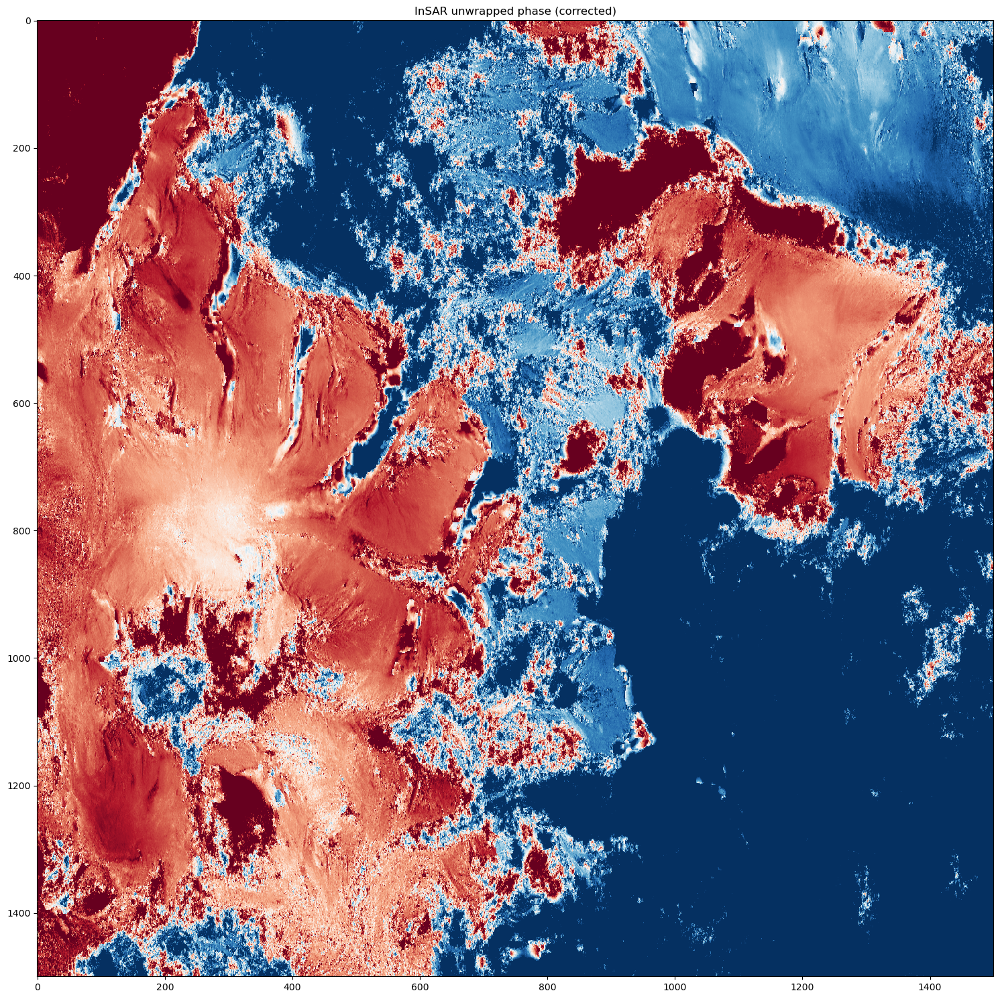

In [126]:
f, ax = plt.subplots(figsize=(15, 15))
ax.imshow(np.flip(unwrapped_noest, 0), cmap='RdBu_r', vmin=-5, vmax=5, interpolation='none')
ax.set_title('InSAR unwrapped phase (corrected)')
f.tight_layout()

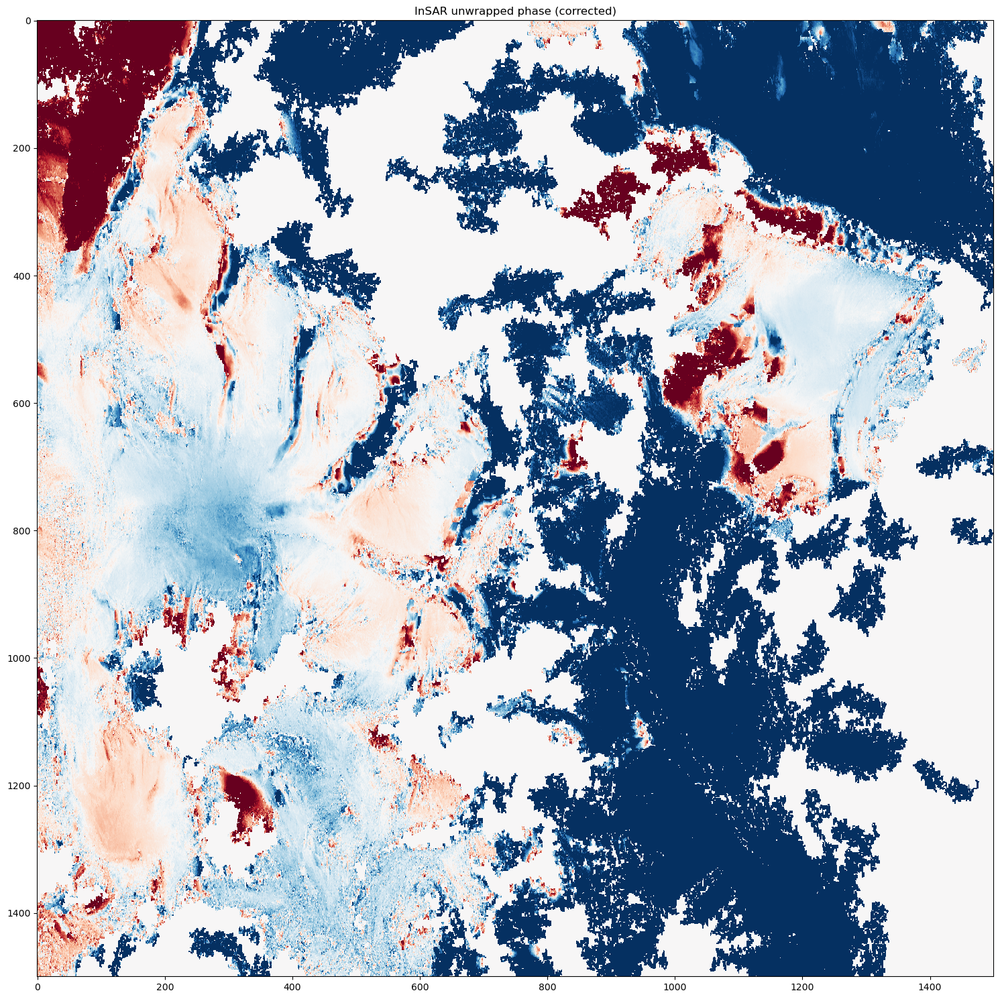

In [133]:
f, ax = plt.subplots(figsize=(15, 15))
ax.imshow(np.flip(np.where(components>0, unwrapped_noest-3, 0), 0), cmap='RdBu_r', vmin=-5, vmax=5, interpolation='none')
ax.set_title('InSAR unwrapped phase (corrected)')
f.tight_layout()

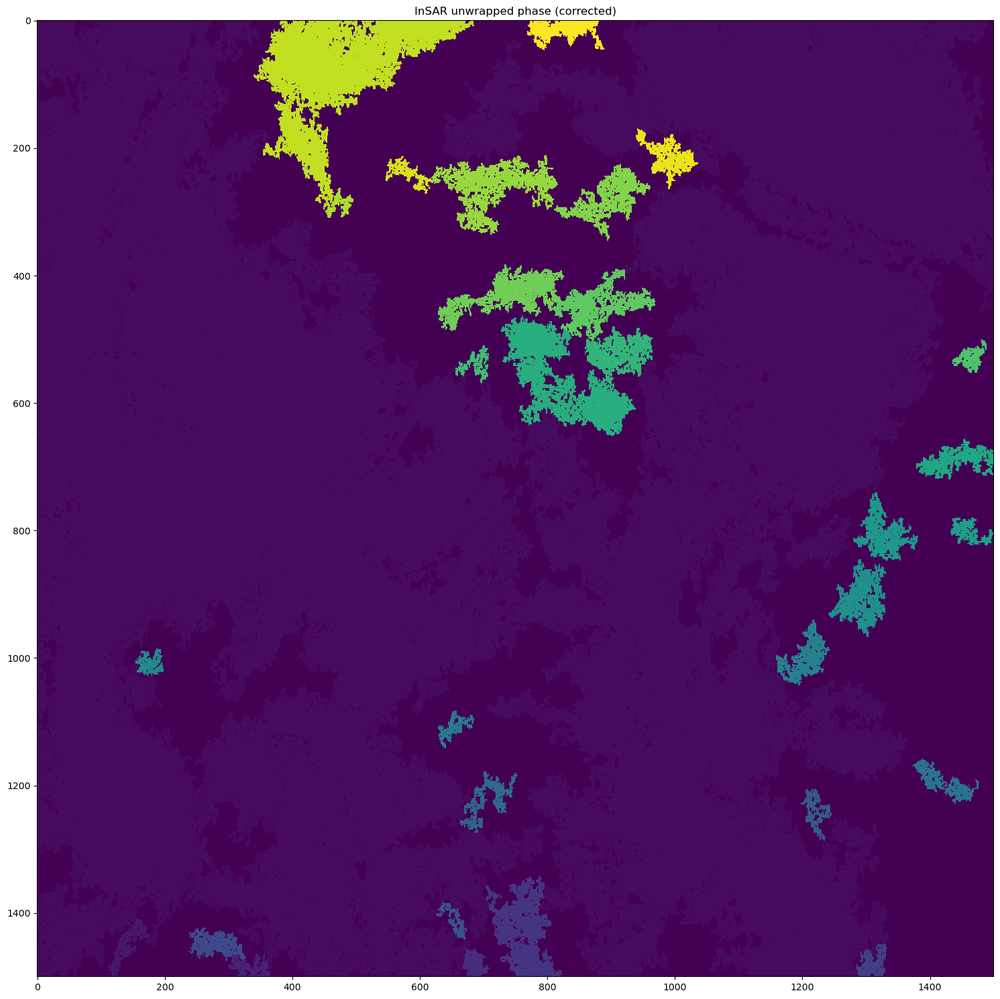

In [134]:
f, ax = plt.subplots(figsize=(15, 15))
ax.imshow(np.flip(components, 0), cmap='viridis', interpolation='none')
ax.set_title('InSAR unwrapped phase (corrected)')
f.tight_layout()

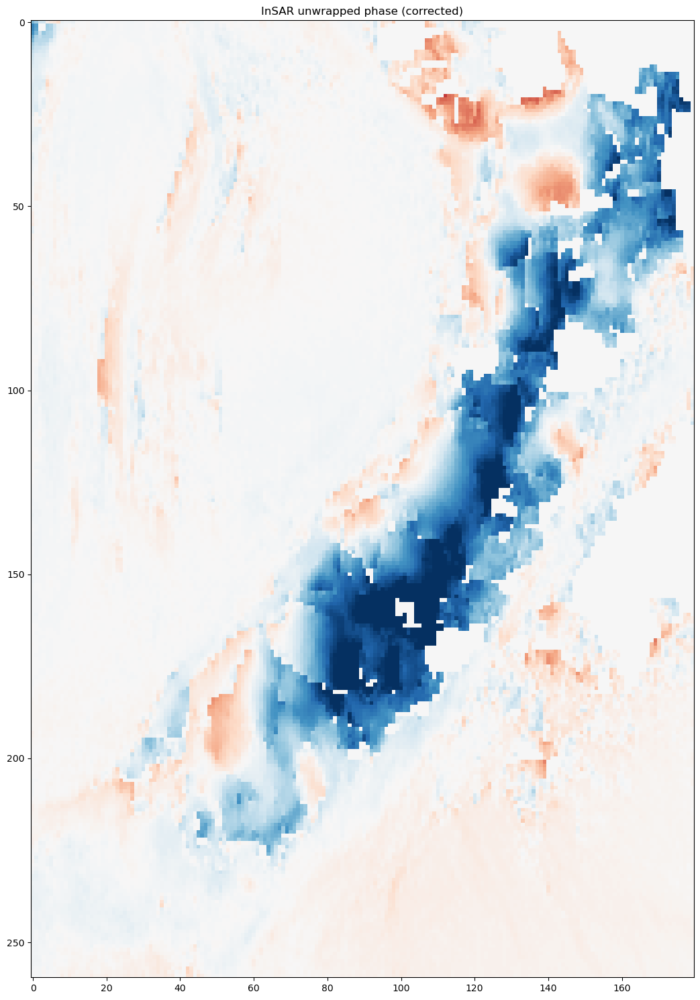

In [34]:
f, ax = plt.subplots(figsize=(15, 15))
ax.imshow(np.flip(np.where(components>0, unwrapped_noest-3, 0), 0)[520:780, 420:600], cmap='RdBu_r', vmin=-15, vmax=15, interpolation='none')
ax.set_title('InSAR unwrapped phase (corrected)')
f.tight_layout()
plt.savefig('unwrapping_errors.png', dpi=400)

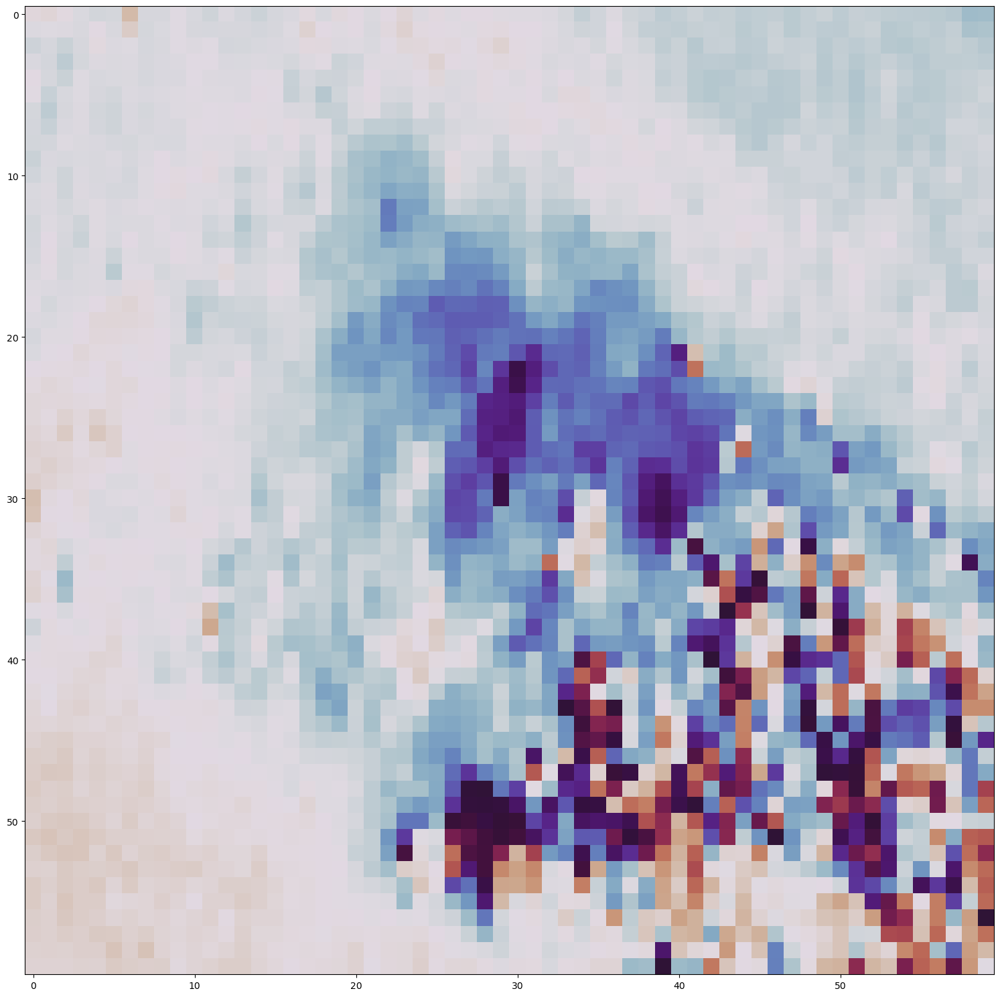

In [44]:
f, ax = plt.subplots(figsize=(15, 15))
ax.imshow(np.flip(np.angle(wrapped), 0)[790:850, 470:530], cmap='twilight', interpolation='none')
f.tight_layout()
plt.savefig('moraine_wrapped.png', dpi=400)

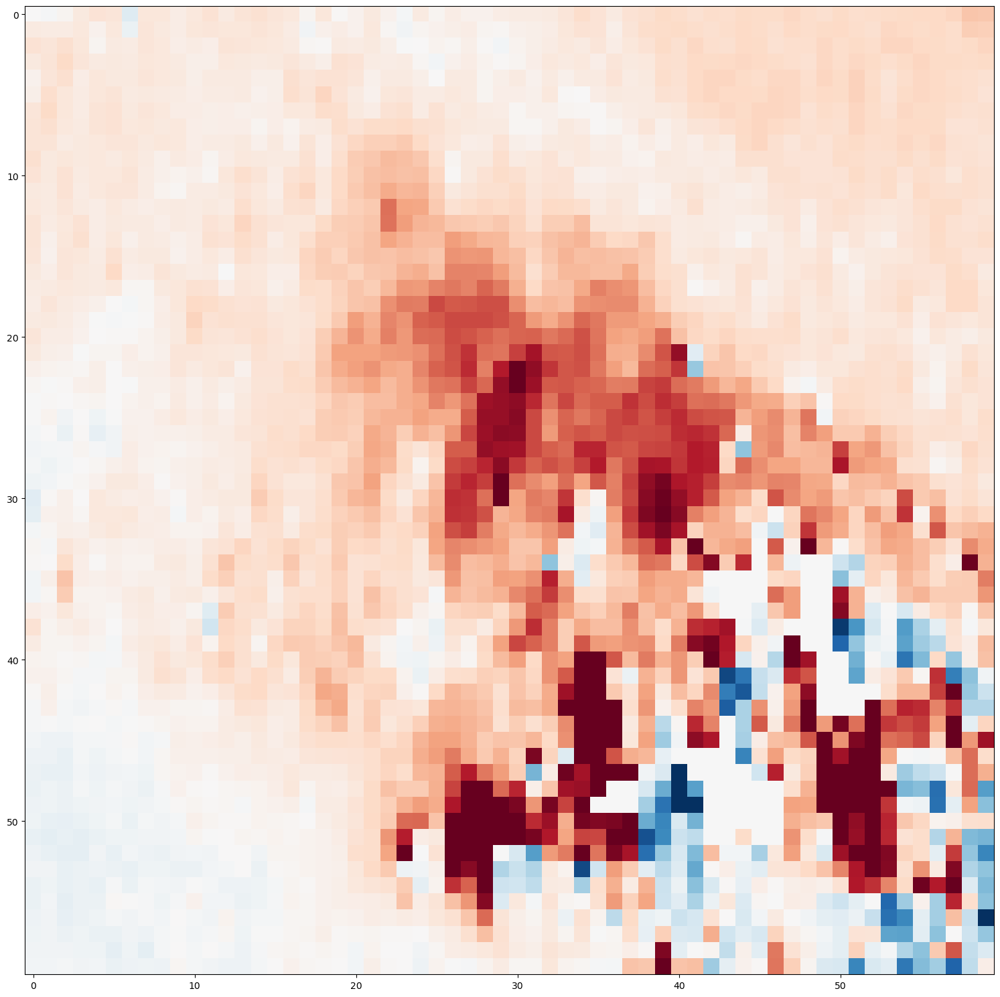

In [46]:
f, ax = plt.subplots(figsize=(15, 15))
ax.imshow(np.flip(np.where(components>0, unwrapped_noest-3, 0), 0)[790:850, 470:530], cmap='RdBu_r', vmin=-3, vmax=3, interpolation='none')
f.tight_layout()
plt.savefig('moraine_unwrapped.png', dpi=400)